<a href="https://colab.research.google.com/github/Lukas-Swc/convnet-course/blob/main/projects/01_convnet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 # Konwolucyjne Sieci Neuronowe - Dogs vs. Cats

 > Projekt polega na przyjrzeniu się sieciom konwolucyjnym (Convolutional Neural Network - CNN) i próbie zastosownia tych sieci w zagadnieniach klasyfikacji obrazu. Pokażemy jak postępować w przypadku  niewielkiego zbioru danych treningowych i jakie techniki zastosować w celu optymalizacji takich modeli.

 > W odróżnieniu od sieci gęstych, które uczą się cech globalnie, sieci konwolucyjne uczą się lokalnych wzorców. Innymi słowy wzorce rozpoznawane przez sieć kownolucyjną są niezależne od przesunięcia, co charakteryzuje sieci CNN bardzo dużą wydajnością.

 > Kolejną zaletą sieci CNN jest możliwość uczenia przestrzennej hierarchii wzorców. Pierwsze warstwy uczą się małych lokalnych wzorców, takich jak krawędzie, zaś klolejne warstwy będą uczyły się większych struktur składających się z elementów rozpoznanych przez początkowe warstwy.

 > Do utworzenia projektu wykorzystano narzędzie dostarczane przez firmę Google, Google Colab, które jest rozszerzoną nakładką na Jupyter Notebook pozwalającą uruchamiać notebooki na procesorze graficznym GPU (Graphics Processing Unit).

### Czyszczenie katalogu roboczego

> **Tip**: Wpisując na początku komórki polecenie `%%bash` jesteśmy w stanie wykonywać polecenia bashowe na systemie goszczącym naszą instancję notebook'a. Na początek wyczyścimy nasz katalog roboczy.

In [1]:
%%bash
rm -rf /content/*

###Zaimportowanie wymaganych bibliotek

In [2]:
import os
import shutil
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
from tensorflow.keras.preprocessing import image

### Pobranie danych
Dane pobierzemy z bucketu S3. S3 jest to usługa storage w chmurze Amazona.

Nazwa bucketu to: `ml-repository-krakers`.

Spakowany plik `dogs-vs-cats.zip` ma nieco ponad 812 MB i jest przechowywany w regionie UE (Ireland).

In [3]:
%%bash
pwd
wget --output-document=cats_and_dogs.zip --quiet https://ml-repository-krakers.s3-eu-west-1.amazonaws.com/kaggle+/cats_and_dogs/dogs-vs-cats.zip
ls

/content
cats_and_dogs.zip


##Wpakowywanie danych

In [4]:
%%bash
unzip cats_and_dogs.zip
# rm -rf cats_and_dogs.zip

rm -rf sampleSubmission.csv

unzip -q train.zip -d /content/kaggle_original_data
rm -rf train.zip
cp /content/kaggle_original_data/train/* /content/kaggle_original_data/
rm -rf /content/kaggle_original_data/train

unzip -q /content/test1.zip
# rm -rf test1.zip
# rm -rf cats_and_dogs.zip
ls

Archive:  cats_and_dogs.zip
  inflating: sampleSubmission.csv    
  inflating: train.zip               
  inflating: test1.zip               
cats_and_dogs.zip
kaggle_original_data
test1
test1.zip


##Zdefiniowanie uzytecznych funkcji

In [5]:
def make_accuracy_plot(history):
    """
    Funkcja zwraca wykres dokładności (accuracy) modelu na zbiorze treningowym
    i walidacyjnym.
    """
    accuracy, val_accuracy = history.history['accuracy'], history.history['val_accuracy']
    epochs = range(1, len(accuracy) + 1)

    plt.figure(figsize=(10, 8))
    plt.plot(epochs, accuracy, label='Dokładność trenowania', marker='o')
    plt.plot(epochs, val_accuracy, label='Dokładność walidacji', marker='o')
    plt.legend()
    plt.title('Dokładność trenowania i walidacji')
    plt.xlabel('Epoki')
    plt.ylabel('Dokładność')
    plt.show()

def make_loss_plot(history):
    """
    Funkcja zwraca wykres straty (loss) modelu na zbiorze treningowym
    i walidacyjnym.
    """
    loss, val_loss = history.history['loss'], history.history['val_loss']
    epochs = range(1, len(loss) + 1)

    plt.figure(figsize=(10, 8))
    plt.plot(epochs, loss, label='Strata trenowania', marker='o')
    plt.plot(epochs, val_loss, label='Strata walidacji', marker='o')
    plt.legend()
    plt.title('Strata trenowania i walidacji')
    plt.xlabel('Epoki')
    plt.ylabel('Strata')
    plt.show()

def display_augmented_images(directory, index):
    """
    Funkcja zwraca wykres przykładowych obrazów uzyskanych za pomocą techniki
    augmentacji danych.
    """
    fnames = [os.path.join(directory, fname) for fname in os.listdir(directory)]
    img_path = fnames[index]
    img = image.load_img(img_path, target_size=(150, 150))

    x = image.img_to_array(img)
    x = x.reshape((1, ) + x.shape)

    i = 1
    plt.figure(figsize=(20, 14))
    for batch in datagen.flow(x, batch_size=1):
        plt.subplot(3, 4, i)
        plt.grid(False)
        imgplot = plt.imshow(image.array_to_img(batch[0]))
        i += 1
        if i % 13 == 0:
            break

### Przygotowanie katologów

Nasze dane będą znajdować się w katalogu:

> `/content/cats_and_dogs`

Podzielimy ten katalog na trzy podkatalogi:
 * train
 * valid
 * test

W zbiorze treningowym odłożymy 2000 próbek (1000 zdjęć psów i 1000 zdjęć kotów), do zbioru walidacyjnego trafi 1000 próbek (500 zdjęć psów i 500 zdjęć kotów), zaś do zbioru testowego ostatnie 1000 próbek (500 zdjęć psów i 500 zdjęć kotów).

In [6]:
# ścieżka do oryginalnego zbioru
original_dataset_dir = '/content/kaggle_original_data'
# katalog, w którym umieścimy nasze dane
base_dir = '/content/cats_and_dogs'

if not os.path.exists(base_dir):
    os.mkdir(base_dir)

train_dir = os.path.join(base_dir, 'train')    # katalog zbioru treningowego
valid_dir = os.path.join(base_dir, 'valid')    # katalog zbioru walidacyjnego
test_dir = os.path.join(base_dir, 'test')      # katalog zbioru testowego

for directory in (train_dir, valid_dir, test_dir):
    if not os.path.exists(directory):
        os.mkdir(directory)

train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')

valid_cats_dir = os.path.join(valid_dir, 'cats')
valid_dogs_dir = os.path.join(valid_dir, 'dogs')

test_cats_dir = os.path.join(test_dir, 'cats')
test_dogs_dir = os.path.join(test_dir, 'dogs')

dirs = [train_cats_dir, train_dogs_dir, valid_cats_dir, valid_dogs_dir, test_cats_dir, test_dogs_dir]

for directory in dirs:
    if not os.path.exists(directory):
        os.mkdir(directory)

In [7]:
# rozdzielamy zdjęcia kotów
fnames = ['cat.{}.jpg'.format(i) for i in range(1000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(train_cats_dir, fname)
    shutil.copyfile(src, dst)

fnames = ['cat.{}.jpg'.format(i) for i in range(1000, 1500)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(valid_cats_dir, fname)
    shutil.copyfile(src, dst)

fnames = ['cat.{}.jpg'.format(i) for i in range(1500, 2000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(test_cats_dir, fname)
    shutil.copyfile(src, dst)

# rozdzielamy zdjęcia psów
fnames = ['dog.{}.jpg'.format(i) for i in range(1000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(train_dogs_dir, fname)
    shutil.copyfile(src, dst)

fnames = ['dog.{}.jpg'.format(i) for i in range(1000, 1500)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(valid_dogs_dir, fname)
    shutil.copyfile(src, dst)

fnames = ['dog.{}.jpg'.format(i) for i in range(1500, 2000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(test_dogs_dir, fname)
    shutil.copyfile(src, dst)

##Sprawdzenie poprawnosci podzialu

In [8]:
print('Liczba kotów - zbiór treningowy', len(os.listdir(train_cats_dir)))
print('Liczba kotów - zbiór walidacyjny', len(os.listdir(valid_cats_dir)))
print('Liczba kotów - zbiór testowy', len(os.listdir(test_cats_dir)))

print('Liczba psów - zbiór treningowy', len(os.listdir(train_dogs_dir)))
print('Liczba psów - zbiór walidacyjny', len(os.listdir(valid_dogs_dir)))
print('Liczba psów - zbiór testowy', len(os.listdir(test_dogs_dir)))

Liczba kotów - zbiór treningowy 1000
Liczba kotów - zbiór walidacyjny 500
Liczba kotów - zbiór testowy 500
Liczba psów - zbiór treningowy 1000
Liczba psów - zbiór walidacyjny 500
Liczba psów - zbiór testowy 500


##Przyjrzenie sie przykladowym obratom - koty

(np.float64(-0.5), np.float64(498.5), np.float64(331.5), np.float64(-0.5))

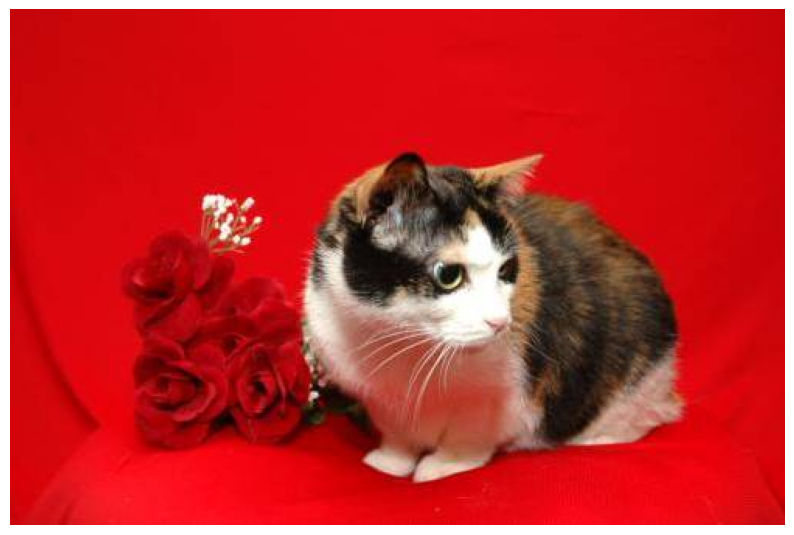

In [9]:
#@title Wybierz indeks przykladowego zdjecia kota:
import tensorflow as tf

index = 777 #@param {type:'slider', min:0, max:999}
img_path = '/content/cats_and_dogs/train/cats/cat.' + str(index) + '.jpg'
img = tf.keras.preprocessing.image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis('off')

##Przyjrzenie sie przykladowym obratom - koty

(np.float64(-0.5), np.float64(124.5), np.float64(250.5), np.float64(-0.5))

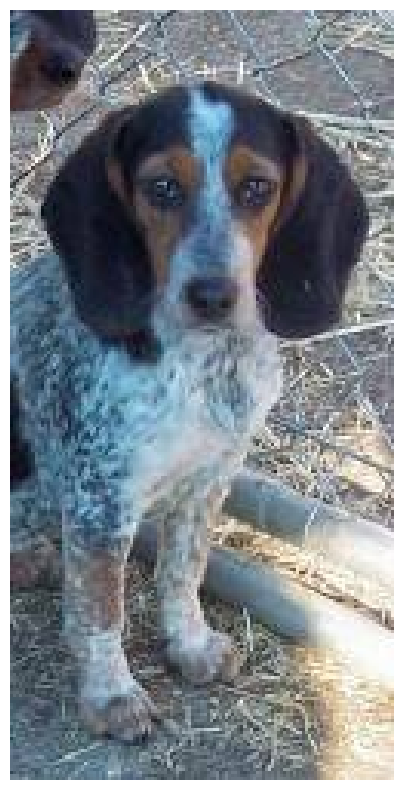

In [10]:
#@title Wybierz indeks przykladowego zdjecia kota:

index = 130 #@param {type:'slider', min:0, max:999}
img_path = '/content/cats_and_dogs/train/dogs/dog.' + str(index) + '.jpg'
img = tf.keras.preprocessing.image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis('off')

### Budowa modelu

> Do budowy modelu wykorzystamy klasę `Sequential` biblioteki `Keras`. Pozwala ona dosyć wygodnie budować model niejako definiując kolejne warstwy tak, jakbyśmy układali je na stosie. Omówimy sobie krótko poszczególne warstwy.

> Warstwa Conv2D jest warstwą konwolucji, w której należy podać minimum trzy parametry: liczbę filtrów, dzięki którym będą wydobywane cechy, rozmiar jądra (wielkość okna konwolucji, zwyczajowo 3x3 lub 5x5) oraz fukncję aktywacji (najczęściej stosowana funkcja `relu`). Dodatkowo w pierwszej warstwie należy określić parametr `input_shape`, który przyjmuje rozmiar danych wejściowych. W naszym przypadku `(150, 150, 3)`. Pierwsze dwie wartości określają szerokość i wysokość obrazka, trzeci natomiast głębię kolorów, w tym przypadku 3.

> Warstwa MaxPooling2D  jest operacją skalowania. W dużym uproszczeniu polega na redukcji wymiarowości przechodząc po obrazie oknami ekstrakcji, które zwracają maksymalną zaobserwowaną wartość w danym oknie (zwykle rozmiar okna 2x2, przy kroku przesunięcia równym 2) pomagając tym samym zmniejszyć rozmiar danych wejściowych do kolejnej warstwy o połowę, co znacząco przyśpiesza proces uczenia.

> Warstwa Flatten wypłaszcza nam nasze dane w celu połączenia ich warstwami gęstymi pod koniec budowy modelu. Ostatnią funkcją aktywacji będzie funkcja `sigmoid`, która zwróci nam prawdobodobieństwa przynależności obrazka do poszczególnej klasy.

In [11]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(150, 150, 3)),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=512, activation='relu'),
    tf.keras.layers.Dense(units=1, activation='sigmoid')
])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     3,211,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,453,121 (13.17 MB)

 Trainable params: 3,453,121 (13.17 MB)

 Non-trainable params: 0 (0.00 B)

Dzięki metodzie `summary()` możemy wyświetlić szczegóły modelu. Model ma do wyuczenia w tym przypadku 3,453,121 parametrów, składa się z 11 warstw (4 warstwy konwolucyjne, 4 warstwy MaxPooling, 1 warstwa Flatten i dwie warstwy gęste)

### Kompilacja modelu

Wyokrzystamy dosyć powszechny optymalizator `RMSProp` przy funkcji straty entropii krzyżowej i metryce dokładności.

In [12]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy'])

### Przetworzenie danych do modelu

Ponieważ nasze dane są nieustandaryzowane (różne rozmiary obrazów) musimy jes przetworzyć, tak aby były przedstawione w formie tensorów wartości zmiennoprzecinkowych (float). Nasze dane są obecnie w postaci plików JPG. W procesie obróbki danych pomoże nam wbudowana w `Keras` klasa `ImageDataGenerator`.  Wszystkie obrazy ze zbioru treningowego i walidacyjnego przeskalujemy do rozmiaru 150x150 pikseli.

#### W skrócie, co zrobimy?:
* wczytamy pliki w formacie JPG
* zdekodujemy format JPG do siatki pikseli w formacie RGB
* zapiszemy dane w formacie tensorów liczb zmiennoprzecinkowych
* przeskalujemy wartości pikseli do zakresu [0, 1] (sieci neuronowe lepiej radzą sobie z małymi wartościami wejściowymi)

In [13]:
# przeskalowujemy wszystkie obrazy o wspolczynnik 1/255
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
valid_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(directory=train_dir,
                                                    target_size=(150, 150),
                                                    batch_size=20,
                                                    class_mode='binary')

valid_generator = valid_datagen.flow_from_directory(directory=valid_dir,
                                                    target_size=(150, 150),
                                                    batch_size=20,
                                                    class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


##Sprawdzanie poprawnosci ksztaltu danych treningowych

In [14]:
for data_batch, labels_batch in train_generator:
  print('Ksztalt danych wsadowych:', data_batch.shape)
  print('Ksztalt etykiet danych wsadowych:', labels_batch.shape)
  break

Ksztalt danych wsadowych: (20, 150, 150, 3)
Ksztalt etykiet danych wsadowych: (20,)


### Dopasowanie modelu

W celu przeprowadzenia trenowania na generatorze należy użyć metody `fit_generator`. Wytrenowany model zapiszemy do pliku `cats_and_dogs_small_1.h5`.

In [15]:
import time

tic = time.time()
history = model.fit(train_generator,
                    steps_per_epoch=100,
                    epochs=30,
                    validation_data=valid_generator,
                    validation_steps=50)

toc = time.time()
print(f'Czas przetwarzania: {toc - tic}')
model.save('cats_and_dogs_small_1.h5')

Epoch 1/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - accuracy: 0.5263 - loss: 0.6937 - val_accuracy: 0.5060 - val_loss: 0.6976
Epoch 2/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step - accuracy: 0.5599 - loss: 0.6786 - val_accuracy: 0.5860 - val_loss: 0.6696
Epoch 3/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step - accuracy: 0.6132 - loss: 0.6521 - val_accuracy: 0.5770 - val_loss: 0.6601
Epoch 4/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.6515 - loss: 0.6190 - val_accuracy: 0.6210 - val_loss: 0.6365
Epoch 5/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.6929 - loss: 0.5915 - val_accuracy: 0.6720 - val_loss: 0.6042
Epoch 6/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.7064 - loss: 0.5661 - val_accuracy: 0.6690 - val_loss: 0.5998
Epoch 7/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - accuracy: 0.7235 - loss: 0.5358 - val_accuracy: 0.6850 - val_loss: 0.5883
Epoch 8/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.7510 - loss: 0.5110 - val_acc

Czas przetwarzania: 195.94248366355896


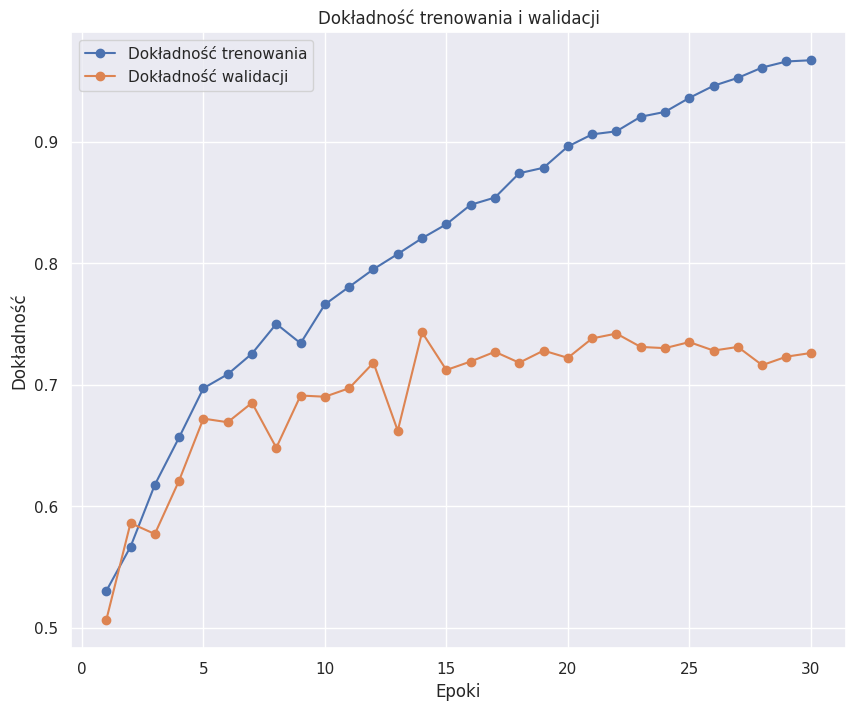

In [16]:
make_accuracy_plot(history)

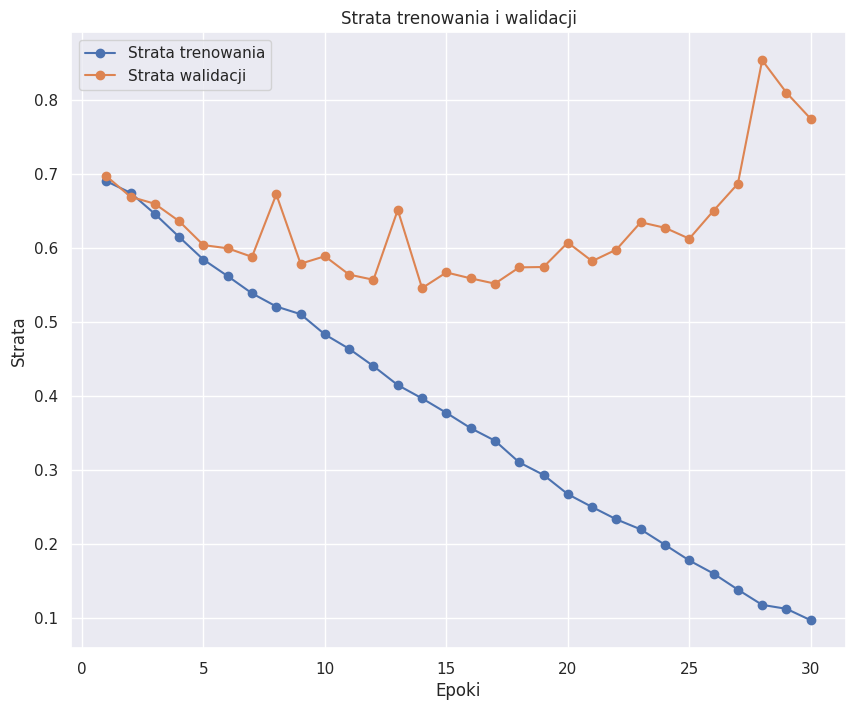

In [17]:
make_loss_plot(history)

Jak widać nasz model uległ przetrenowaniu - nadmiernemu dopasowaniu (overfitting) już po ok. 10 epokach uzyskując dokładność na poziomie ok. 73%. Nie jest to zadowalajcy wynik i postaramy się przy użyciu różnych technik poprawić nasz model. Potraktujemy ten wynik jako nasz benchmark do kolejnych modeli.

## Augmentacja Danych

Pierwszą z technik, którą sobie omówimy jest technika augmentacji danych. Jest ona szczególnie przydatna  w przypadkach niewystarczającej ilości danych treningowych. Polega ona na różnych przekształceniach naszych  danych wejściowych poprzez takie operacje jak przycinanie, obrót czy powiększanie w celu wygenerowania nowych danych wejściowych (nowych obrazków).

Więcej na temat klasy `ImageDataGenerator` i jej parametrów na stronie [dokumentacji biblioteki Keras](https://keras.io/preprocessing/image/#imagedatagenerator-class).

In [18]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=40,      # zakres kąta o który losowo zostanie wykonany obrót obrazów
    width_shift_range=0.2,  # pionowe przekształcenia obrazu
    height_shift_range=0.2, # poziome przekształcenia obrazu
    shear_range=0.2,        # zares losowego przycianania obrazu
    zoom_range=0.2,         # zakres losowego przybliżania obrazu
    horizontal_flip=True,   # losowe odbicie połowy obrazu w płaszczyźnie poziomej
    fill_mode='nearest'     # strategia wypełniania nowo utworzonych pikseli, któe mogą powstać w wyniku przekształceń
)

##Wyswietlenie kilku przykladow augmentacji - koty

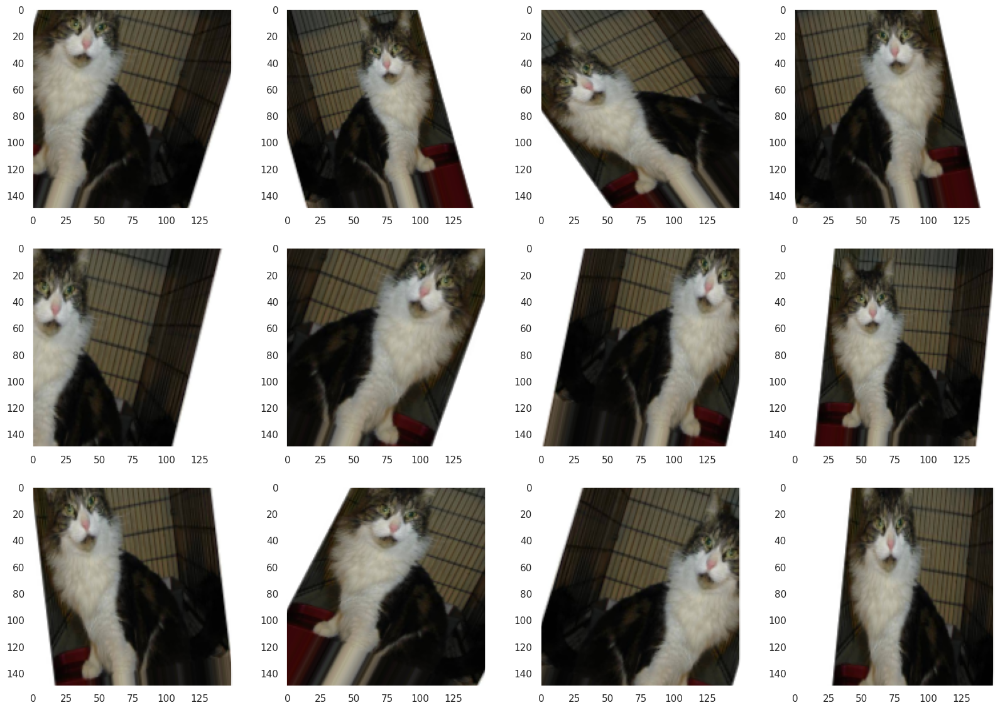

In [19]:
#@title Wybierz index obrazka w celu jego ekxploracji

index = 323 #@param {type:'slider', min:0, max:999}
display_augmented_images(train_cats_dir, index)

### Wyświetlenie kliku przykładów augmentacji - psy

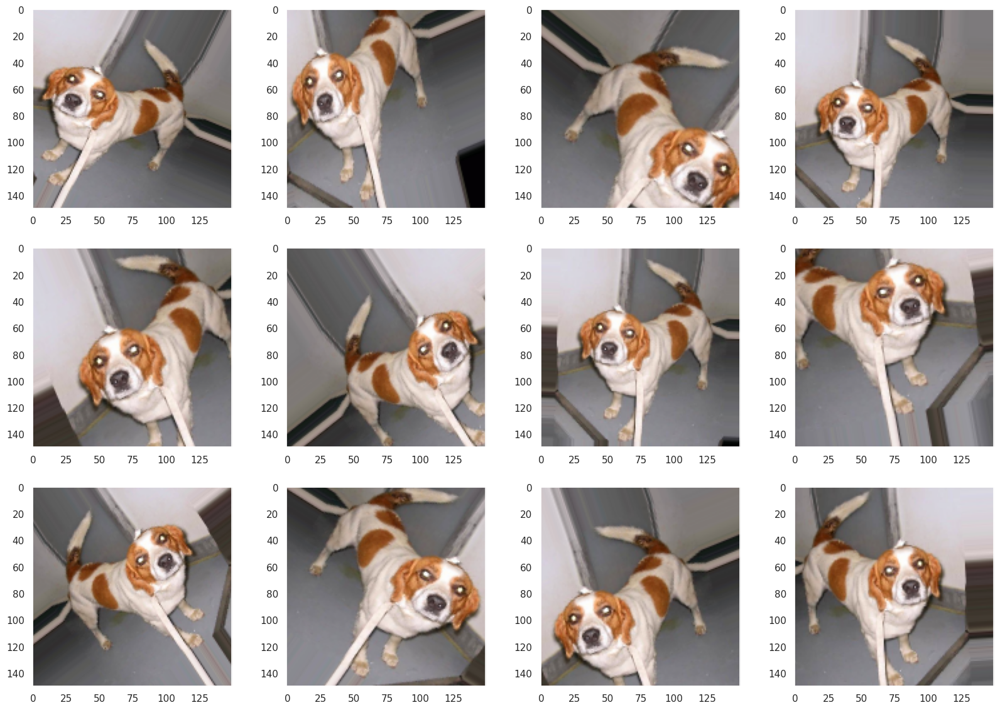

In [20]:
index = 425 #@param {type:'slider', min:0, max:999}
display_augmented_images(train_dogs_dir, index)

### Trenowanie konwolucyjnej sieci neuronowej z wykorzystaniem obrazów wygenerowanych za pomocą augmentacji danych

In [21]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(150, 150, 3)),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(units=512, activation='relu'),
    tf.keras.layers.Dense(units=1, activation='sigmoid')
])

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     3,211,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,453,121 (13.17 MB)

 Trainable params: 3,453,121 (13.17 MB)

 Non-trainable params: 0 (0.00 B)

In [22]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [23]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255.,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

# nie modyfikujemy danych walidacyjnych!!!
valid_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

train_generator = train_datagen.flow_from_directory(directory=train_dir,
                                                    target_size=(150, 150),
                                                    batch_size=32,
                                                    class_mode='binary')

valid_generator = valid_datagen.flow_from_directory(directory=valid_dir,
                                                    target_size=(150, 150),
                                                    batch_size=32,
                                                    class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


###Trenowanie modelu

In [24]:
history = model.fit(train_generator,
                    steps_per_epoch=100,
                    epochs=50,
                    validation_data=valid_generator,
                    validation_steps=50)

Epoch 1/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 24s 195ms/step - accuracy: 0.5256 - loss: 0.7014 - val_accuracy: 0.5130 - val_loss: 0.6910
Epoch 2/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - accuracy: 0.5254 - loss: 0.6943 - val_accuracy: 0.5980 - val_loss: 0.6897
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 14s 144ms/step - accuracy: 0.5552 - loss: 0.6879 - val_accuracy: 0.5820 - val_loss: 0.6704
Epoch 4/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - accuracy: 0.5795 - loss: 0.6744 - val_accuracy: 0.6430 - val_loss: 0.6465
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - accuracy: 0.6022 - loss: 0.6634 - val_accuracy: 0.5880 - val_loss: 0.6485
Epoch 6/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - accuracy: 0.6135 - loss: 0.6409 - val_accuracy: 0.6420 - val_loss: 0.6200
Epoch 7/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - accuracy: 0.6587 - loss: 0.6264 - val_accuracy: 0.6460 - val_loss: 0.6126
Epoch 8/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - accuracy: 0.6285 - loss: 0

### Zapisanie modelu do pliku

In [25]:
model.save('cats_and_dogs_small_2.keras')

### Wykres dokładności trenowania i walidacji

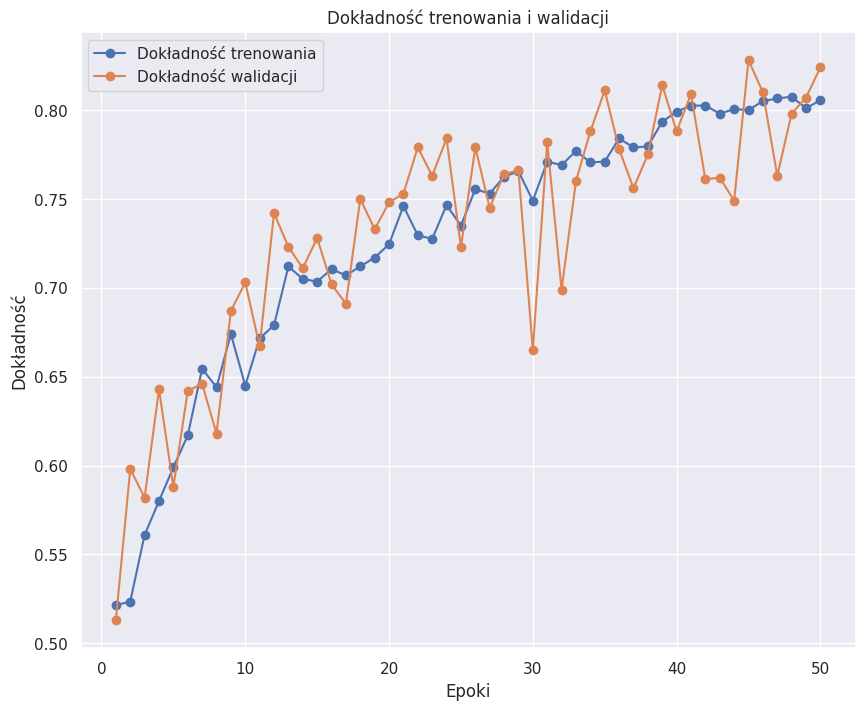

In [26]:
make_accuracy_plot(history)

### Wykres straty trenowania i walidacji

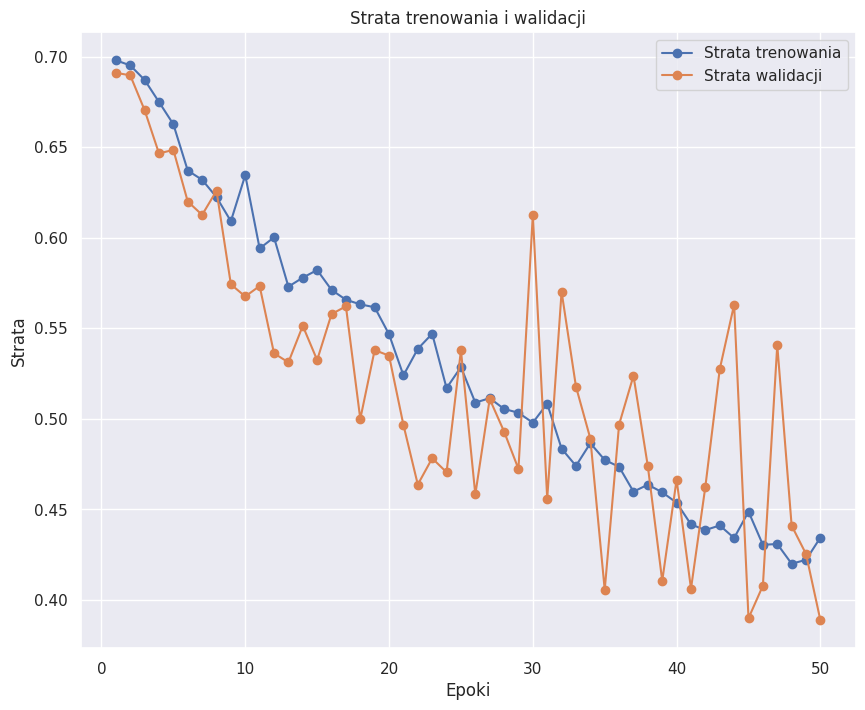

In [27]:
make_loss_plot(history)

Po zastosowaniu techniki augmentacji danych model znacząco poprawił swoją moc. Dokładność modelu oscyluje w granicach 82-84% co już jest całkiem dobrym wynikiem. Patrząc na funkcję straty sam model ulega przeuczeniu po około 40 epokach. Należy zwrócić uwagę na niestabilność miary dokładności na danych walidacyjnych. Zajmiemy się tym w kolejnych krokach.

### Transfer Learning - korzystanie z uprzednio przetrenowango modelu

Transfer Learning polega na wykorzystaniu już przetrenowenego modelu, zwykle na bardzo dużym zbiorze wejściowym i wykorzystaniu architektury takiego modelu jak i wag w naszym procesie uczenia. W tym celu zastosujemy architekturę modelu VGG16 (zawierającego 16 warstw) przetrenowanego na zbiorze `Imagenet`.  Zbiór `Imagenet` składa się z 1.4 mln obrazów podzielonych na 1000 klas, które zawierają także różne rasy psów i kotów. Gotowy model dostępny jest w bibliotece Keras.

In [90]:
conv_base = tf.keras.applications.VGG16(weights='imagenet',
                                        include_top=False, # czy dolaczyc gorna czesc sieci, jezeli True dolaczy gesto polaczona warstwe z 1000 klas
                                        input_shape=(150, 150, 3))

conv_base.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)     │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

## Ekstrakcja cech z augmentacją danych

Wykorzystamy zalety Transfer Learningu a także techniki augmentacji danych. Do pobranego modelu dorzucimy trzy ostatnie warstwy: warstwę Flatten i dwie warstwy gęste (Dense).

In [94]:
model = tf.keras.models.Sequential([
    conv_base,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=256, activation='relu'),
    tf.keras.layers.Dense(units=1, activation='sigmoid')
])

model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,812,353 (64.13 MB)

 Trainable params: 2,097,665 (8.00 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

### Trenowanie modelu od początku do końca przy zamrożonej bazie konwolucyjnej

Zamrozimy teraz wagi sieci VGG16 w celu zapobiegnięcia aktualizacji tych wag w procesie trenowania. Gdybyśmy tego nie zrobili to cechy, których model się nauczył mogłyby zostać zmodyfikowane podczas trenowania.

In [96]:
print('Liczba wag poddawanych trenowaniu przed zamrozeniem bazy:', len(model.trainable_weights))
conv_base.trainable = False
print('Liczba wag poddawanych trenowaniu po zamrozeniu bazy:', len(model.trainable_weights))

Liczba wag poddawanych trenowaniu przed zamrozeniem bazy: 4
Liczba wag poddawanych trenowaniu po zamrozeniu bazy: 4


In [97]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255.,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

# dane walidacyjne nie moga byc modyfikowane!!!
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

train_generator = train_datagen.flow_from_directory(directory=train_dir,
                                                    target_size=(150, 150),
                                                    batch_size=20,
                                                    class_mode='binary')

valid_generator = valid_datagen.flow_from_directory(directory=valid_dir,
                                                    target_size=(150, 150),
                                                    batch_size=20,
                                                    class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [98]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=2e-5),
              loss='binary_crossentropy',
              metrics=['accuracy'])

history = model.fit(train_generator,
                    steps_per_epoch=100,
                    epochs=10,
                    validation_data=valid_generator,
                    validation_steps=50,
                    verbose=2)

Epoch 1/10
100/100 - 21s - 206ms/step - accuracy: 0.6825 - loss: 0.5910 - val_accuracy: 0.8300 - val_loss: 0.4449
Epoch 2/10
100/100 - 20s - 205ms/step - accuracy: 0.7925 - loss: 0.4792 - val_accuracy: 0.8500 - val_loss: 0.3700
Epoch 3/10
100/100 - 19s - 187ms/step - accuracy: 0.8155 - loss: 0.4269 - val_accuracy: 0.8610 - val_loss: 0.3299
Epoch 4/10
100/100 - 21s - 208ms/step - accuracy: 0.8290 - loss: 0.3882 - val_accuracy: 0.8760 - val_loss: 0.3041
Epoch 5/10
100/100 - 20s - 203ms/step - accuracy: 0.8345 - loss: 0.3870 - val_accuracy: 0.8810 - val_loss: 0.2919
Epoch 6/10
100/100 - 17s - 174ms/step - accuracy: 0.8360 - loss: 0.3651 - val_accuracy: 0.8880 - val_loss: 0.2837
Epoch 7/10
100/100 - 17s - 175ms/step - accuracy: 0.8390 - loss: 0.3628 - val_accuracy: 0.8920 - val_loss: 0.2787
Epoch 8/10
100/100 - 17s - 173ms/step - accuracy: 0.8575 - loss: 0.3452 - val_accuracy: 0.8850 - val_loss: 0.2774
Epoch 9/10
100/100 - 17s - 174ms/step - accuracy: 0.8595 - loss: 0.3227 - val_accuracy: 

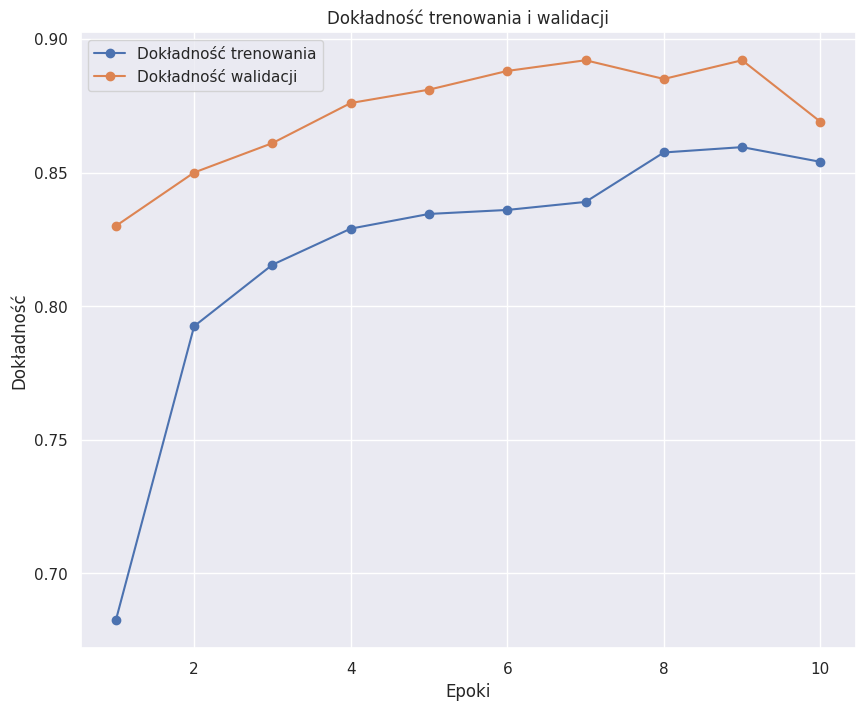

In [99]:
make_accuracy_plot(history)

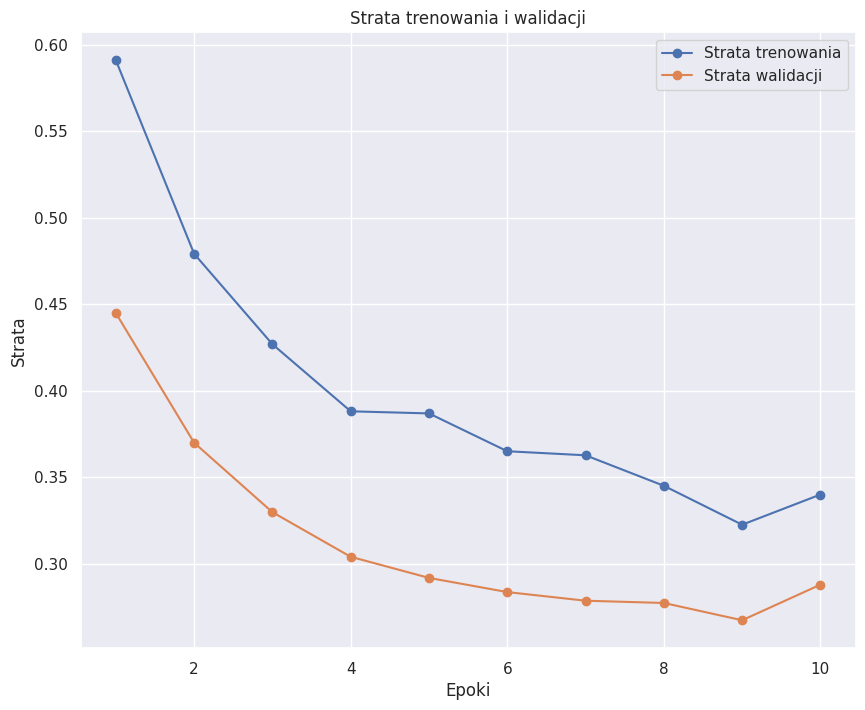

In [100]:
make_loss_plot(history)

### Dostrajanie

Wcześniejsze warstwy bazy konwolucyjnej uczą się bardziej ogólnych cech (np.krawędzie) zaś wyższe warstwy bardziej wyspecjalizowane cechy. Dzięki temu możemy spróbować poprawić jakość naszgo modelu korzystając z techniki dostrajania.

Technika ta polega na 'odmrożeniu' kilku górnych warstw zamrożonej bazy modelu. Dostroimy trzy ostatnie warstwy konwolucyjne (`block5_conv1, block5_conv2, block5_conv3`).  

In [108]:
conv_base = tf.keras.applications.VGG16(weights='imagenet',
                 include_top=False,    # czy dołączyć górną cześć sieci, jeżeli True dołączy gęsto połączoną warstwę z 1000 klas
                 input_shape=(150, 150, 3))

conv_base.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_20 (InputLayer)     │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [109]:
conv_base.trainable = True

def print_layers(model):
    for layer in model.layers:
        print('layer_name: {:12}, trainable: {}'.format(layer.name, layer.trainable))

print_layers(conv_base)

layer_name: input_layer_20, trainable: True
layer_name: block1_conv1, trainable: True
layer_name: block1_conv2, trainable: True
layer_name: block1_pool , trainable: True
layer_name: block2_conv1, trainable: True
layer_name: block2_conv2, trainable: True
layer_name: block2_pool , trainable: True
layer_name: block3_conv1, trainable: True
layer_name: block3_conv2, trainable: True
layer_name: block3_conv3, trainable: True
layer_name: block3_pool , trainable: True
layer_name: block4_conv1, trainable: True
layer_name: block4_conv2, trainable: True
layer_name: block4_conv3, trainable: True
layer_name: block4_pool , trainable: True
layer_name: block5_conv1, trainable: True
layer_name: block5_conv2, trainable: True
layer_name: block5_conv3, trainable: True
layer_name: block5_pool , trainable: True


In [110]:
set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

print_layers(conv_base)

layer_name: input_layer_20, trainable: False
layer_name: block1_conv1, trainable: False
layer_name: block1_conv2, trainable: False
layer_name: block1_pool , trainable: False
layer_name: block2_conv1, trainable: False
layer_name: block2_conv2, trainable: False
layer_name: block2_pool , trainable: False
layer_name: block3_conv1, trainable: False
layer_name: block3_conv2, trainable: False
layer_name: block3_conv3, trainable: False
layer_name: block3_pool , trainable: False
layer_name: block4_conv1, trainable: False
layer_name: block4_conv2, trainable: False
layer_name: block4_conv3, trainable: False
layer_name: block4_pool , trainable: False
layer_name: block5_conv1, trainable: True
layer_name: block5_conv2, trainable: True
layer_name: block5_conv3, trainable: True
layer_name: block5_pool , trainable: True


In [112]:
model = tf.keras.models.Sequential([
    conv_base,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=256, activation='relu'),
    tf.keras.layers.Dense(units=1, activation='sigmoid')
])

model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-5),
             loss='binary_crossentropy',
             metrics=['accuracy'])

model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,812,353 (64.13 MB)

 Trainable params: 9,177,089 (35.01 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

### Trenowanie modelu

In [114]:
history = model.fit(train_generator,
                             steps_per_epoch=100,
                             epochs=20,
                             validation_data=valid_generator,
                             validation_steps=50)

Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 22s 189ms/step - accuracy: 0.6442 - loss: 0.6269 - val_accuracy: 0.8310 - val_loss: 0.3690
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 24s 236ms/step - accuracy: 0.8016 - loss: 0.4175 - val_accuracy: 0.8880 - val_loss: 0.2510
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 199ms/step - accuracy: 0.8721 - loss: 0.3107 - val_accuracy: 0.8960 - val_loss: 0.2273
Epoch 4/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 18s 183ms/step - accuracy: 0.8811 - loss: 0.2707 - val_accuracy: 0.9100 - val_loss: 0.2075
Epoch 5/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 18s 182ms/step - accuracy: 0.8865 - loss: 0.2837 - val_accuracy: 0.9190 - val_loss: 0.1949
Epoch 6/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 21s 183ms/step - accuracy: 0.8818 - loss: 0.2641 - val_accuracy: 0.9230 - val_loss: 0.1907
Epoch 7/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 21s 190ms/step - accuracy: 0.8899 - loss: 0.2501 - val_accuracy: 0.9240 - val_loss: 0.1845
Epoch 8/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 186ms/step - accuracy: 0.8908 - loss: 0

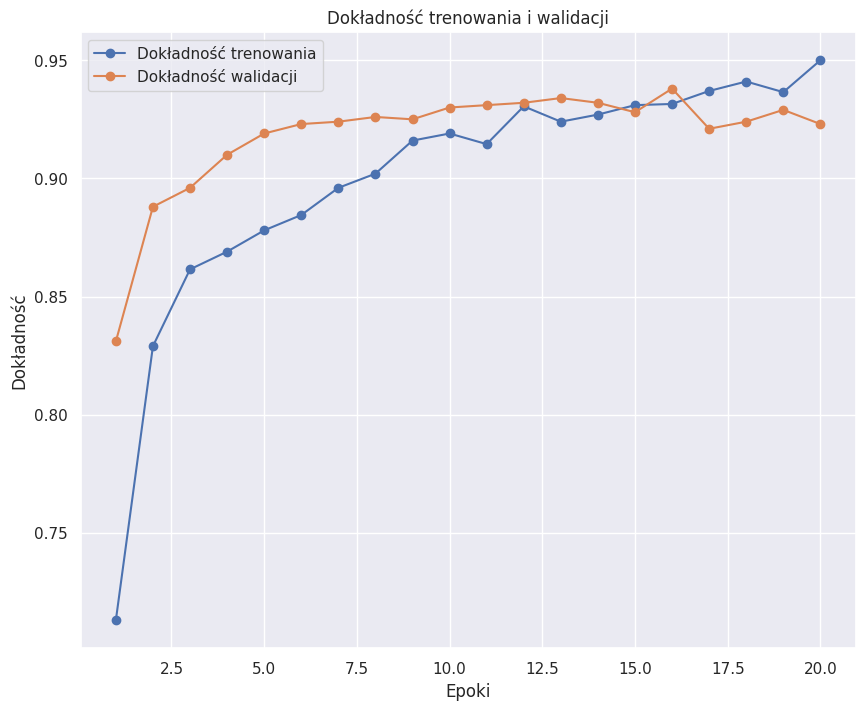

In [115]:
make_accuracy_plot(history)

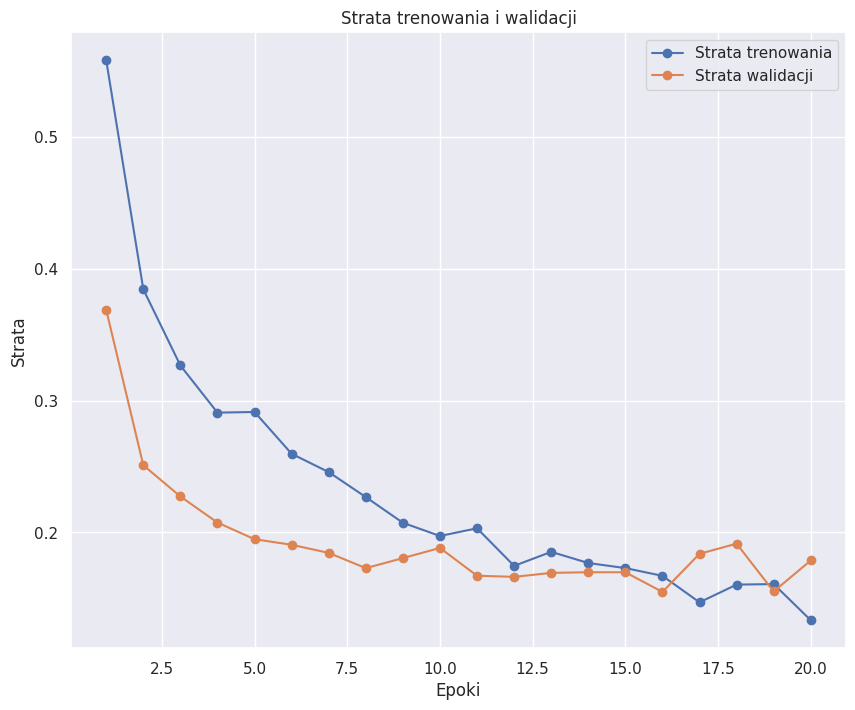

In [116]:
make_loss_plot(history)

In [118]:
test_generator = test_datagen.flow_from_directory(test_dir,
                                                 target_size=(150, 150),
                                                 batch_size=20,
                                                 class_mode='binary')

test_loss, test_acc = model.evaluate(test_generator, steps=50)
print('Dokładność testowania:', test_acc)

Found 1000 images belonging to 2 classes.
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.9390 - loss: 0.1859
Dokładność testowania: 0.9399999976158142


## Wizualizacja efektów uczenia sieci konwolucyjnych

*  wizualizacja pośrednich danych wejściowych
*  wizualizacja filtrów sieci konwolucyjnej
*  wizualizacja map ciepła aktywacji klas obrazu

###  Wizualizacja pośrednich danych wejściowych

Polega na wyświetlaniu map cech, które generują się przez różne warstwy konwolucyjne.

In [119]:
model = tf.keras.models.load_model('cats_and_dogs_small_2.keras')
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     3,211,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,906,244 (26.35 MB)

 Trainable params: 3,453,121 (13.17 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,453,123 (13.17 MB)

In [120]:
#@title Wybierz indeks obrazka:
index = 1559 #@param {type:'slider', min:1500, max:1999}
img_path = '/content/cats_and_dogs/test/cats/cat.' + str(index) + '.jpg'

from keras.preprocessing import image
import numpy as np

# przetwarzamy obraz tak aby uzyskał formę czterowymiaorwego tensora
img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

print(img_tensor.shape)

(1, 150, 150, 3)


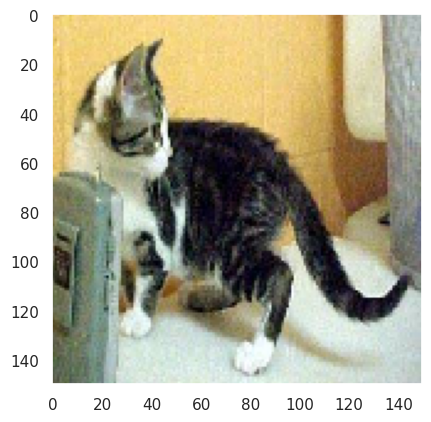

In [121]:
plt.imshow(img_tensor[0])
plt.grid(False)

In [129]:
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import Dense

inputs = Input(shape=(150, 150, 3))
x = Dense(512, activation='relu')(inputs)
x = Dense(512, activation='relu')(x)
outputs = Dense(10, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [127]:
from tensorflow.keras import models

In [130]:
layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_tensor)

first_layer_activation = activations[0]
print(first_layer_activation.shape)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
(1, 150, 150, 3)


###Wysietlenie map cech

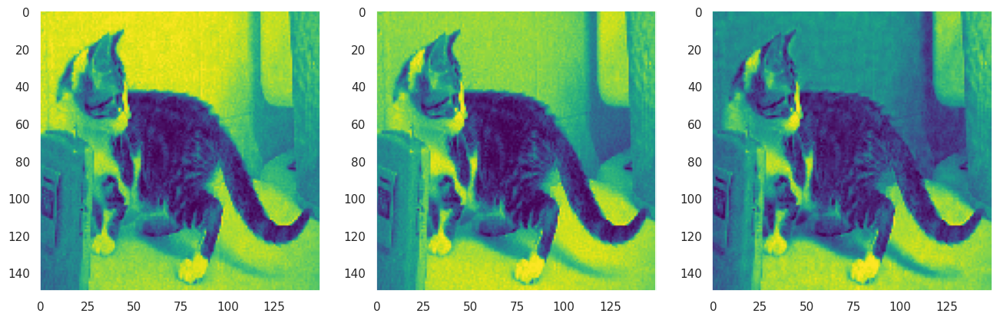

In [131]:
plt.figure(figsize=(16, 16))

# Get the depth of the first layer's activation
depth = first_layer_activation.shape[-1]

for i in range(depth):
    plt.subplot(1, depth, i + 1)
    plt.imshow(first_layer_activation[0, :, :, i], cmap='viridis')
    plt.grid(False)

### Wizualizacja wszystkich kanałów każdej pośredniej warstwy aktywacji

Pierwsza warstwa wykrywa takie niskopoziomowe elementy jak krawędzie, itd. Na tym etapie aktywacje zachowują prawie wszystkie informacje obecne w wejściowym obrazie. Następne warstwy stają się już coraz bardziej abstrakcyjne i trudniejsze w interpretacji graficznej. Pozwalają one kodować wysokopoziomowe cechy takie jak 'kocie ucho', 'kocie oko'. Wyższe warstwy zawierają coraz mniej informacji dotyczących wizualnej zawartości obrazu i jednocześnie zawierają coraz więcej informacji związanych z klasą obrazu.

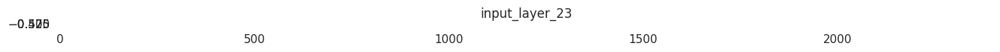

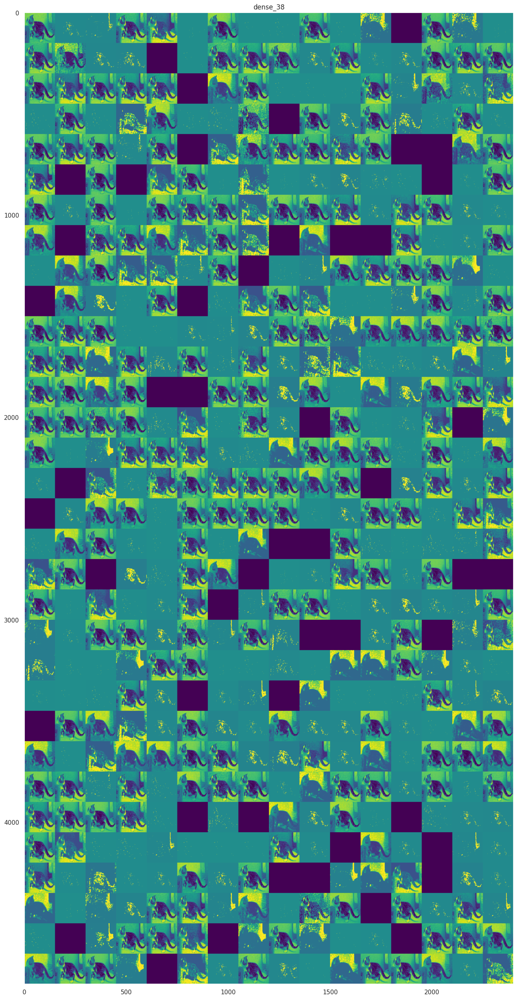

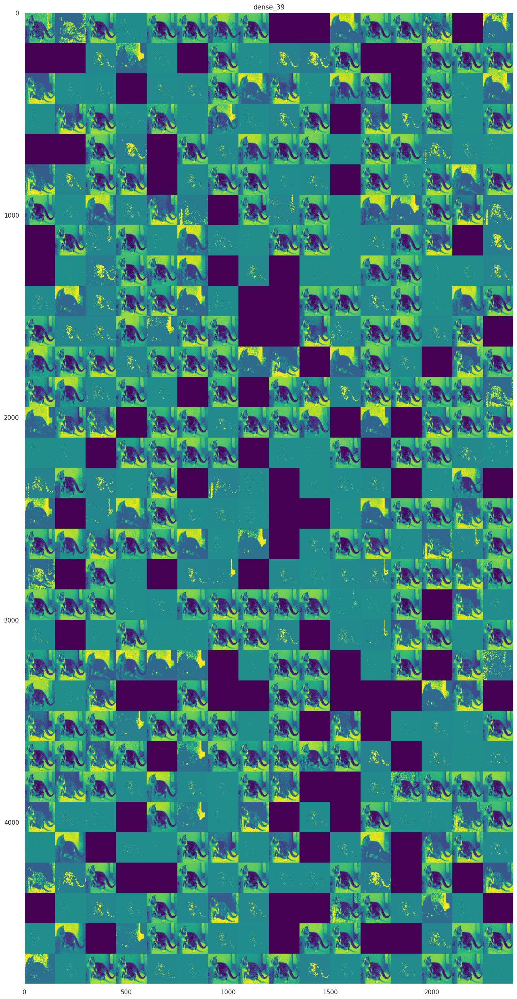

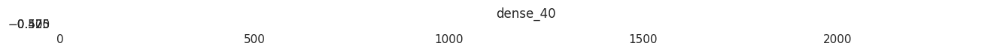

In [132]:
layer_names = [layer.name for layer in model.layers[:8]]

images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]

    size = layer_activation.shape[1]

    n_cols = n_features // images_per_row

    display_grid = np.zeros((size * n_cols, images_per_row * size))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size: (col + 1) * size, row * size: (row+ + 1) * size] = channel_image

    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

### Wizualizacja filtrów konwolucyjnych sieci neuronowych

Filtr konwolucyjny to inaczej graficzny wzorzec na który reaguje podany filtr.

In [142]:
from keras.applications import VGG16
import tensorflow as tf

model = VGG16(weights='imagenet',
             include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output

def deprocess_image(x):
    x -= tf.reduce_mean(x)
    x /= (tf.math.reduce_std(x) + 1e-5)
    x *= 0.1
    x += 0.5
    x = tf.clip_by_value(x, 0, 1)
    x *= 255
    x = tf.clip_by_value(x, 0, 255).numpy().astype('uint8')
    return x

def generate_pattern(layer_name, filter_index, size=150):
    # Build a model that returns the activation of the target layer
    layer_output = model.get_layer(layer_name).output
    layer_model = tf.keras.models.Model(inputs=model.input, outputs=layer_output)

    # Generate a random input image
    input_img_data = tf.random.uniform((1, size, size, 3)) * 20 + 128.0
    input_img_data = tf.Variable(input_img_data)

    step = 1.0
    for i in range(40):
        with tf.GradientTape() as tape:
            # Compute the loss: the mean activation of the target filter
            loss = tf.reduce_mean(layer_model(input_img_data)[:, :, :, filter_index])

        # Compute the gradient of the loss with respect to the input image
        grads = tape.gradient(loss, input_img_data)

        # Normalize the gradients
        grads = grads / (tf.sqrt(tf.reduce_mean(tf.square(grads))) + 1e-5)

        # Update the input image
        input_img_data.assign_add(grads * step)

    # Postprocess the final input image
    img = input_img_data[0].numpy()
    return deprocess_image(img)

In [143]:
model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_29 (InputLayer)     │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, None, None, 64) │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, None, None, 64) │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, None, None, 64) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, None, None,     │        73,856 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, None, None,     │       147,584 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, None, None,     │       295,168 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, None, None,     │     1,180,160 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │             

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

### Wyświetlenie kilku przykładowych fitrów

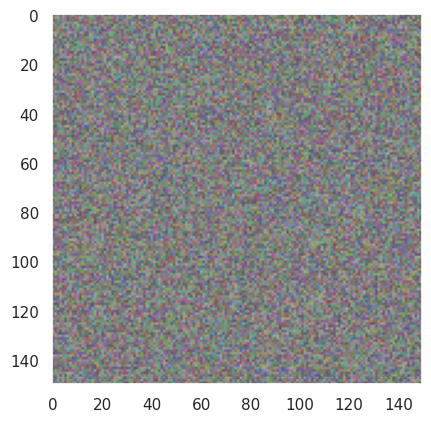

In [150]:
#@title Wybierz warstwę:
layer = 'block5_conv3' #@param ['block4_conv1', 'block4_conv2', 'block4_conv3', 'block5_conv1', 'block5_conv2', 'block5_conv3']
plt.imshow(generate_pattern(layer, 1))
plt.grid(False)

### Wizualizacje map ciepła aktywacji klas

Na koniec bardzo użyteczna technika wizualizacji. Jest niesłychanie pomocna w procesie debugowania modelu. Pozwala nam stwierdzić na podstawie której części obrazu model podjął taką a nie inną decyzję. Przydatna do eksploracji błędnie sklasyfikowanych obrazów.

W tym celu skorzystamy z implementacji opisanej w artykule [`Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization`](https://arxiv.org/abs/1610.02391).

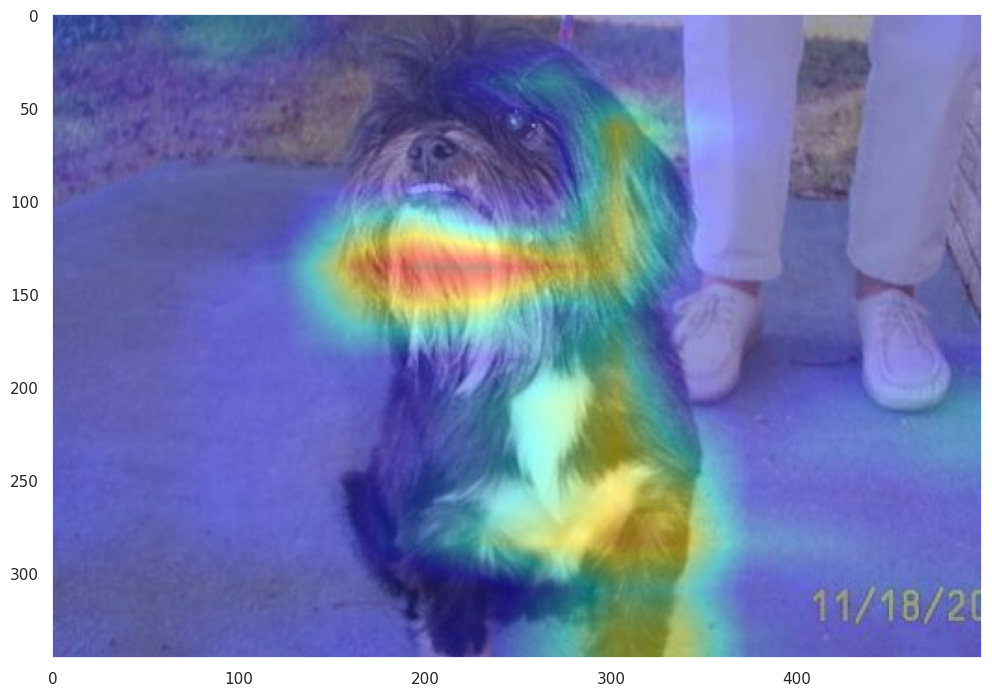

In [163]:
#@title Wybierz numer indeksu zdjęcia
from keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
from keras.preprocessing import image
import numpy as np
import cv2
import tensorflow as tf

pets = 'dogs' #@param ['cats', 'dogs']
index = 1927 #@param {'type': 'slider', min :1500, max: 1999}

# Load the VGG16 model
model = VGG16(weights="imagenet")

# Get the last convolutional layer
last_conv_layer = model.get_layer("block5_conv3")

# Create a model that outputs both the final prediction and the last convolutional layer's output
grad_model = tf.keras.models.Model(
    inputs=[model.inputs],
    outputs=[model.output, last_conv_layer.output]
)

# Load and preprocess the image
img_path = '/content/cats_and_dogs/test/' + pets + '/' + pets[:3] + '.' + str(index) + '.jpg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

# Compute the gradient of the top predicted class with respect to the activations of the last convolutional layer
with tf.GradientTape() as tape:
    model_output, last_conv_layer_output = grad_model(x)
    pred_index = tf.argmax(model_output[0])
    class_channel = model_output[:, pred_index]

grads = tape.gradient(class_channel, last_conv_layer_output)

# This is a vector where each entry is the mean intensity of the gradient over a specific feature map channel
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

# Multiply each channel in the last convolutional layer by the gradient importance
last_conv_layer_output = last_conv_layer_output[0]
heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
heatmap = tf.squeeze(heatmap)


# For visualization purposes, we will also normalize the heatmap between 0 & 1
heatmap = tf.maximum(heatmap, 0)
if tf.reduce_max(heatmap) != 0:
    heatmap /= tf.reduce_max(heatmap)
else:
    heatmap = tf.zeros_like(heatmap)

# We superimpose the heatmap onto the original image
img = cv2.imread(img_path)

# Resize the heatmap to the original image size
heatmap = cv2.resize(heatmap.numpy(), (img.shape[1], img.shape[0]))

# Convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# Apply the colormap to the heatmap
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# Superimpose the heatmap on the original image
superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

# Display the images
plt.figure(figsize=(12, 10))
plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)) # Convert BGR to RGB for matplotlib
plt.grid(False)
plt.show()

Obszary zaznaczone na obrazie jako te 'bardziej czerwone' miały silny wpływ na końcową predykcję modelu. Przykładowo, dla indeksu nr 1748 algorytm bardzo dokładnie wskazał, że przy podejmowaniu decyzji kierował się obszarem obrazu, w którym była zawarta głowa psa (w tym przypadku rasy Husky). Być może tym co pozwoliło zdecydować sieci o kategori obrazu były cechy takie jak kształt/kolor oczu czy kolor sierści wokół oczu.

##Wnioski

*  Konwolucyjne sieci neuronowe są najlepszymi modelami uczenia maszynowego w zadaniach związanych z przetwarzaniem obrazu
*  Sieci konwolucyjne można trenować nawet na małych zbiorach danych, w tym celu pomocna okazuje się augmentacja danych i transfer learning (przykład: zdjęcia medyczne)
*  Możliwość stosowania transfer learningu pozwala trenować modele w znacznie krótszym czasie przy zdecydowanie większej skuteczności takiego modelu wobec modelu opartego tylko na danych, którymi dysponujemy
*  Techniki dostrajania pozwalają przystosować wyuczone wcześniej modele do naszego problemu, co w gruncie rzeczy powinno prowadzić do poprawy skuteczności pracy modelu
* Jak głosi powszechne przekonanie o sieciach neuronowych jako o 'czarnych skrzynkach' to w przypadku sieci konwolucyjnych poszczególne etapy działania sieci są proste w wizualizacji.

> Dzięki zastosowaniu różnych technik optymalizacji modelu (augmentacja danych, transfer learning) z bazowego modelu o poziomie dokładności ok. 73% udało się uzyskać model z dokładnością ok. 93% co jest bardzo zadawalającym wynikiem.

> Projekt można potraktować jako szablon do zadań klasyfikacyjnych obrazu dla klasyfikacji binarnej. Jedyne co należy zmienić to dane wejściowe i niektóre nazwy ścieżek dostępu. Oczywiście, gdy nasze dane będą 'dość duże' można uruchomić klaster obliczeniowy w chmurze, w tym celu polecam narzędzie Amazon SageMaker lub AI Platform udostępniane przez Google Cloud Platform.